In [11]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns


In [12]:
%matplotlib inline
sns.set_context('notebook')
%config InlineBackend.figure_format = 'retina'

In [13]:
data = pd.read_csv('DOC_Input1.csv')

In [14]:
data.columns


Index(['ID', 'Site Number', 'Site Location', 'Cluster Name', 'Site Acronym',
       'Date', 'DOC', 'UVA', 'SUVA', 'TDN', 'E. coli', 'Coliform',
       'Mycobacterium', 'Season', 'Year', '4 Year'],
      dtype='object')

In [25]:
data.head()

,ID,Site Number,Site Location,Cluster Name,Site Acronym,Date,DOC,UVA,SUVA,TDN,E. coli,Coliform,Mycobacterium,Season,Year,4 Year
0,12268,HWY 87,AZ Canal at Highway 87,srp,az canal @ hwy 87,1/1/2021,NaN,NaN,NaN,NaN,NaN,NaN,4.0,Winter,2021,NaN
1,12269,PIMA,AZ Canal at Pima Rd.,srp,az canal @ pima,1/1/2021,NaN,NaN,NaN,NaN,NaN,NaN,13.0,Winter,2021,NaN
2,12263,R11,CAP Canal at Cross-connect,cap,cap @ x con,1/1/2021,4.4,0.015,0.3,0.331,154.0,55.0,89.0,Winter,2021,NaN
3,12266,R12,AZ Canal above CAP Cross-connect,srp,az canal inflow,1/1/2021,NaN,NaN,NaN,NaN,NaN,NaN,53.0,Winter,2021,NaN
4,12267,R13,AZ Canal below CAP Cross-connect,srp,az canal blw cap,1/1/2021,NaN,NaN,NaN,NaN,NaN,NaN,8.0,Winter,2021,NaN


In [26]:
htmp= data.drop(columns=['ID', 'Site Number', 'Site Location', 'Cluster Name', 'UVA', 'SUVA', 'TDN', 'E. coli', 'Coliform',
       'Mycobacterium', 'Year', '4 Year'], axis=1).set_index('Site Acronym')

In [27]:
htmp


,Date,DOC,Season
Site Acronym,,,
az canal @ hwy 87,1/1/2021,NaN,Winter
az canal @ pima,1/1/2021,NaN,Winter
cap @ x con,1/1/2021,4.40,Winter
az canal inflow,1/1/2021,NaN,Winter
az canal blw cap,1/1/2021,NaN,Winter
...,...,...,...
az canal @ central ave.,6/6/2016,3.75,Spring
az canal @ 56th st.,6/6/2016,4.51,Spring
verde @ beeline,6/6/2016,2.32,Spring


In [28]:
htmp1=htmp.pivot( columns='Site', values='DOC')

KeyError: 'Site'

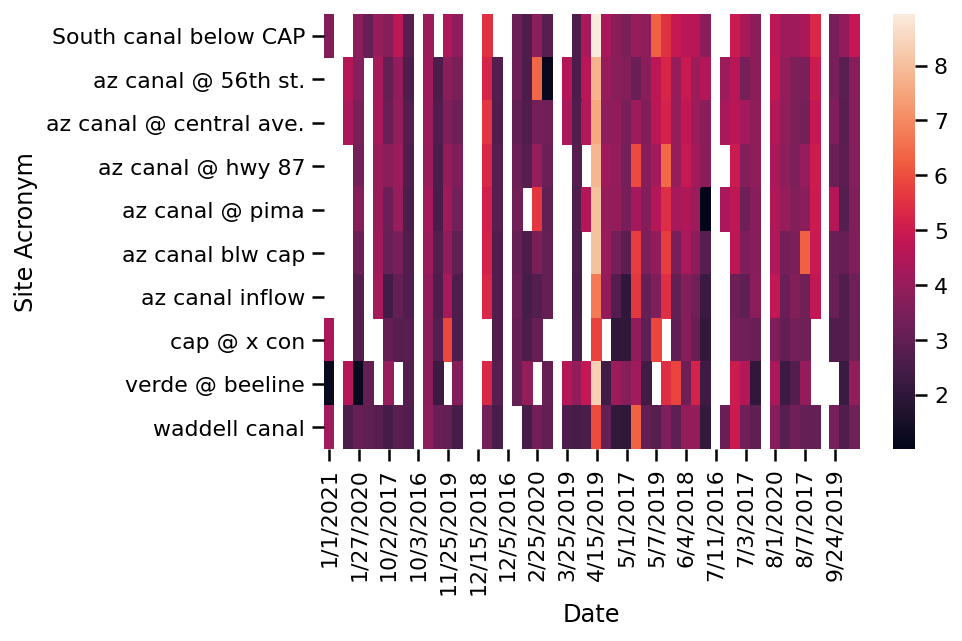

In [21]:
sns.heatmap(htmp1)



In [23]:
htmp1.pivot_table(index='site Acronym', columns='Date', values='DOC')

KeyError: 'DOC'

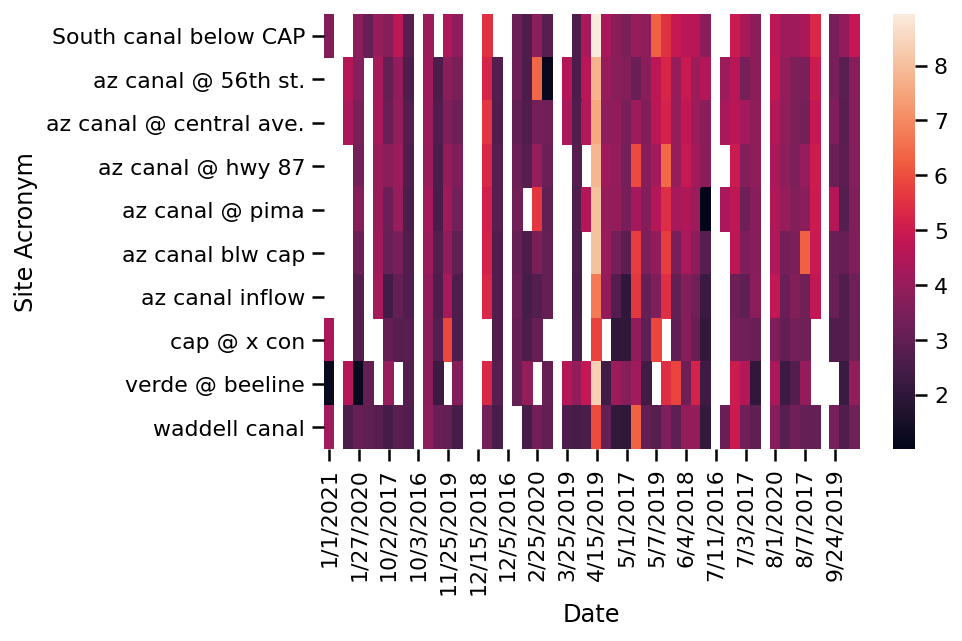

In [22]:
sns.heatmap(htmp1)

/home/saleh/miniconda3/envs/qiime2/lib/python3.6/site-packages/pandas/plotting/_matplotlib/tools.py:307: MatplotlibDeprecationWarning: 
The rowNum attribute was deprecated in Matplotlib 3.2 and will be removed two minor releases later. Use ax.get_subplotspec().rowspan.start instead.
  layout[ax.rowNum, ax.colNum] = ax.get_visible()
/home/saleh/miniconda3/envs/qiime2/lib/python3.6/site-packages/pandas/plotting/_matplotlib/tools.py:307: MatplotlibDeprecationWarning: 
The colNum attribute was deprecated in Matplotlib 3.2 and will be removed two minor releases later. Use ax.get_subplotspec().colspan.start instead.
  layout[ax.rowNum, ax.colNum] = ax.get_visible()
/home/saleh/miniconda3/envs/qiime2/lib/python3.6/site-packages/pandas/plotting/_matplotlib/tools.py:313: MatplotlibDeprecationWarning: 
The rowNum attribute was deprecated in Matplotlib 3.2 and will be removed two minor releases later. Use ax.get_subplotspec().rowspan.start instead.
  if not layout[ax.rowNum + 1, ax.colNum]:
/home

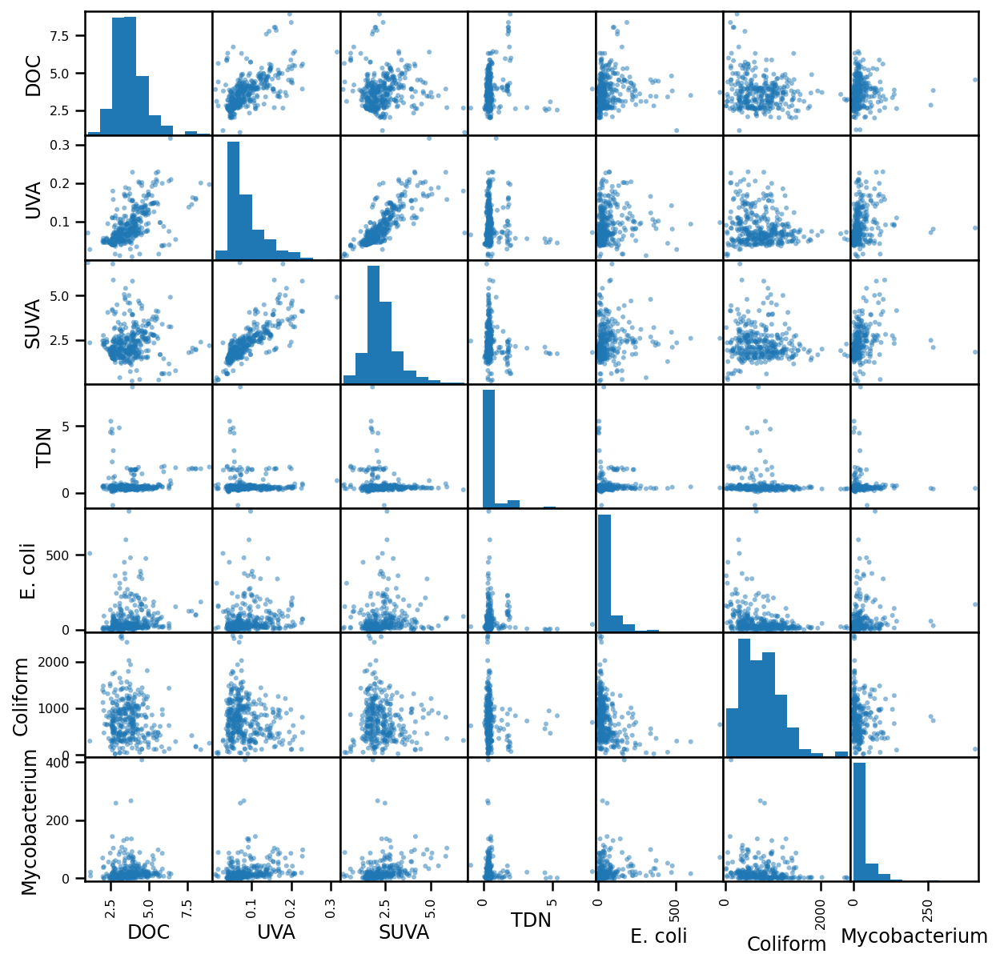

In [5]:
import matplotlib.pyplot as plt
from pandas.plotting import scatter_matrix
scatter_matrix(data[['DOC', 'UVA', 'SUVA', 'TDN', 'E. coli', 'Coliform',
       'Mycobacterium']], figsize = (10, 10))
plt.show()

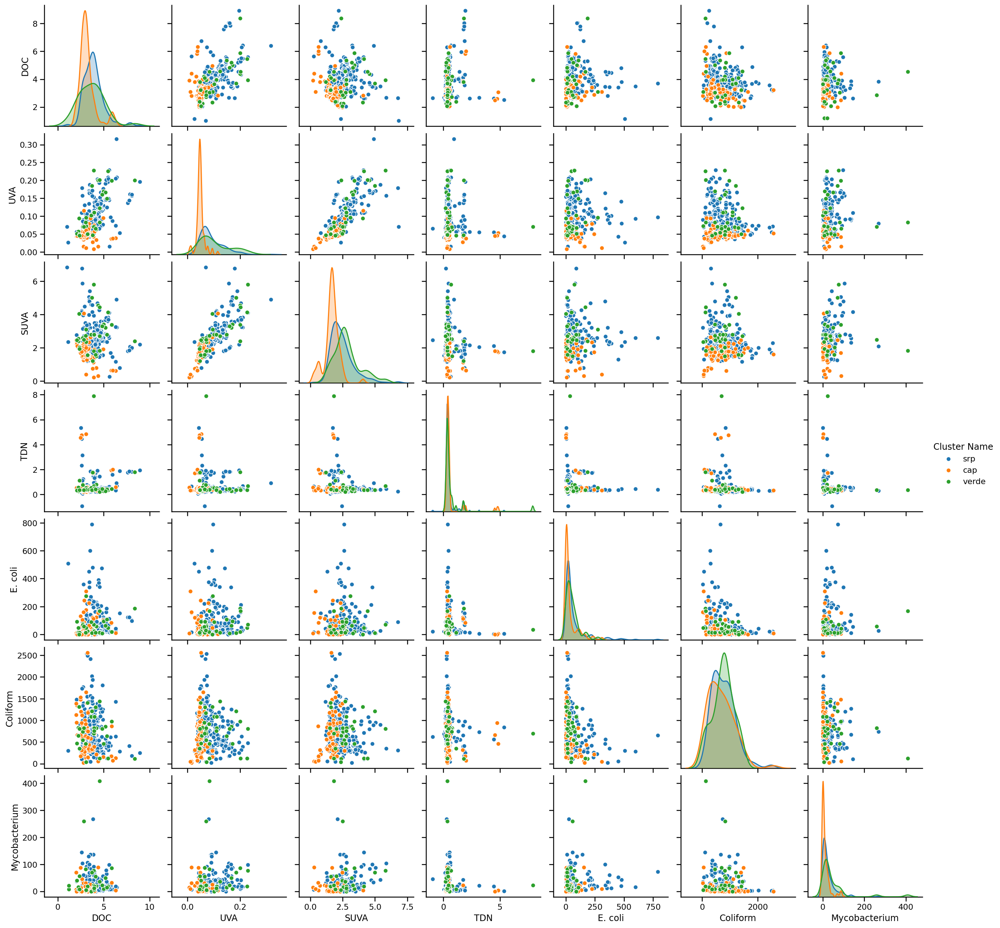

In [6]:
saleh=sns.pairplot(data,vars=['DOC', 'UVA', 'SUVA', 'TDN', 'E. coli', 'Coliform',
       'Mycobacterium'], hue= 'Cluster Name')

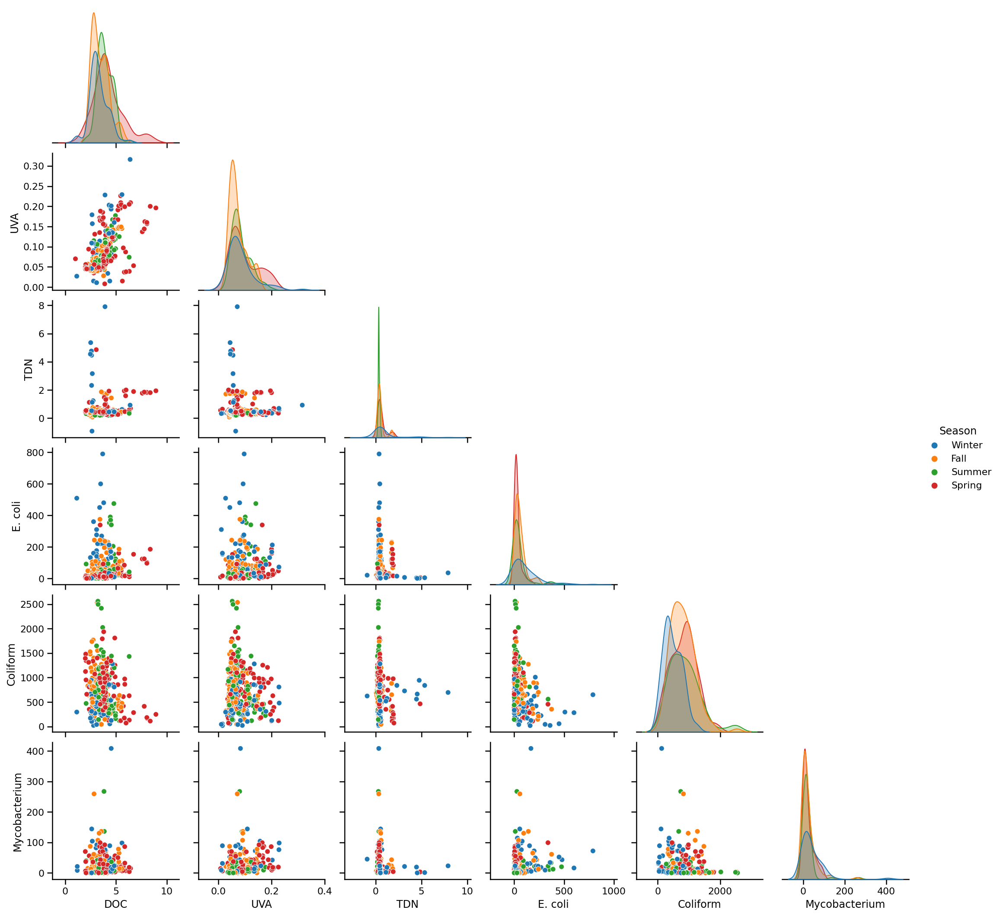

In [23]:

sns.pairplot(data,vars=['DOC', 'UVA', 'TDN', 'E. coli', 'Coliform',
       'Mycobacterium'],corner=True, hue= 'Season')

In [27]:
saleh

/home/salorain/miniconda3/envs/qiime2-2020.11/lib/python3.6/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)


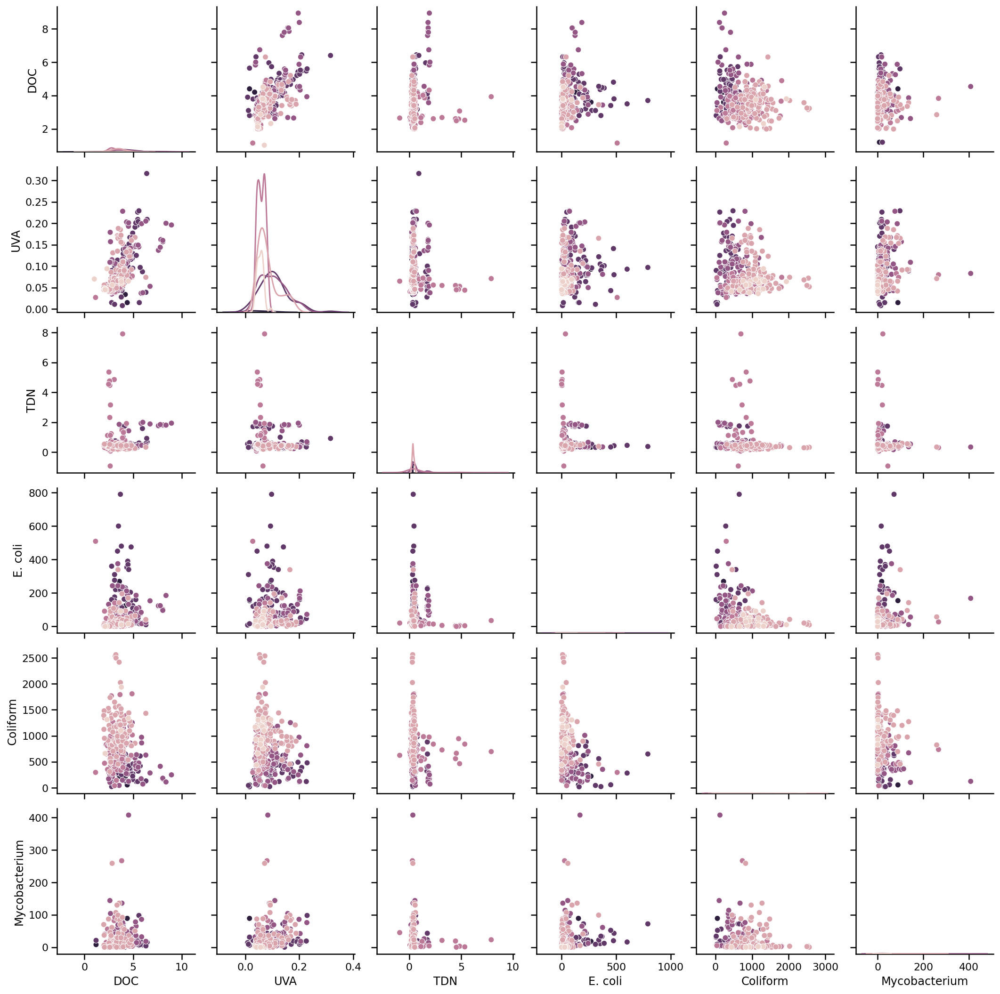

In [25]:
g = sns.PairGrid(data,vars=['DOC', 'UVA', 'TDN', 'E. coli', 'Coliform',
       'Mycobacterium'], hue= 'Year')
g.map_diag(sns.kdeplot)
g.map_offdiag(sns.scatterplot)
g.add_legend;

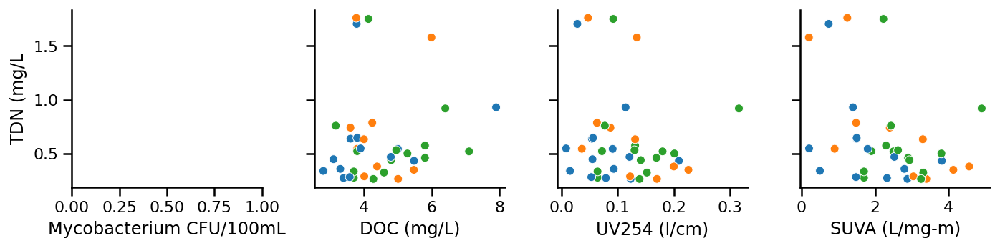

In [29]:
g = sns.PairGrid(data,
                 x_vars=['Mycobacterium CFU/100mL','DOC (mg/L)','UV254 (l/cm)','SUVA (L/mg-m)'], 
                 y_vars=['TDN (mg/L'],diag_sharey=False, hue= 'Location')
g.map_diag(sns.kdeplot)
g.map_offdiag(sns.scatterplot);

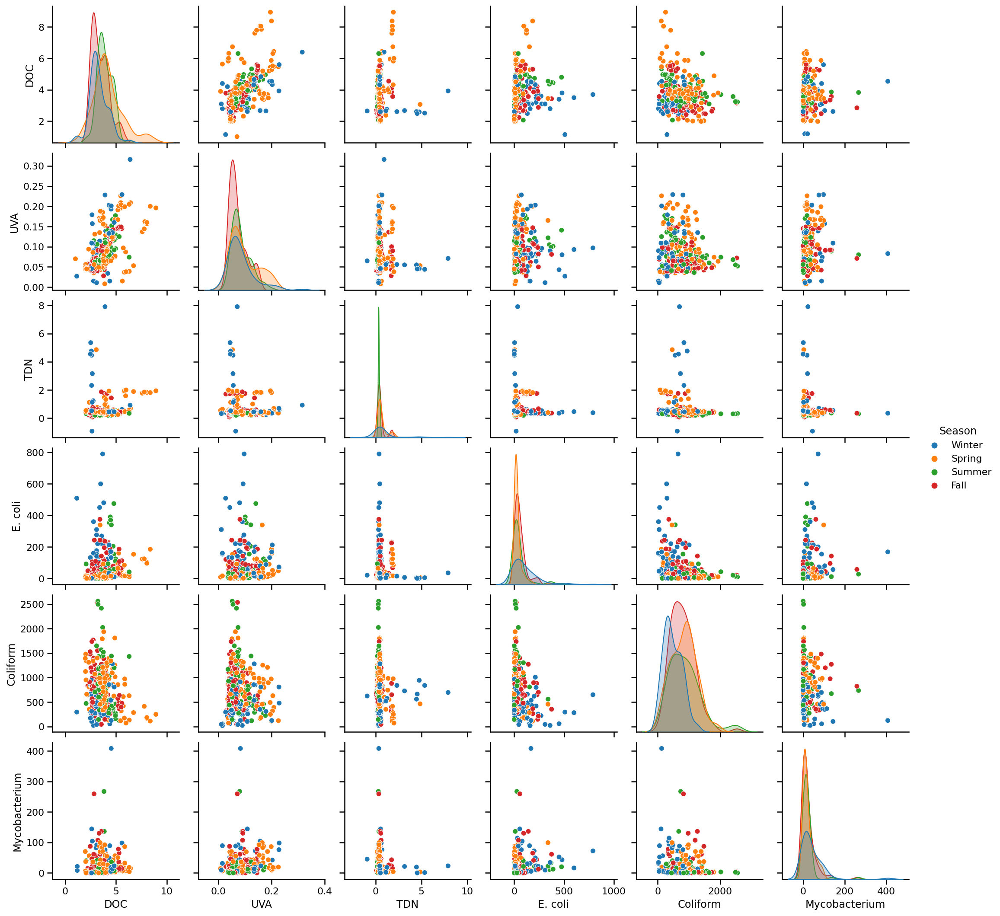

In [9]:
saleh=sns.pairplot(data,vars=['DOC', 'UVA', 'TDN', 'E. coli', 'Coliform',
       'Mycobacterium'],  hue= 'Season', hue_order= ['Winter','Spring','Summer','Fall'])

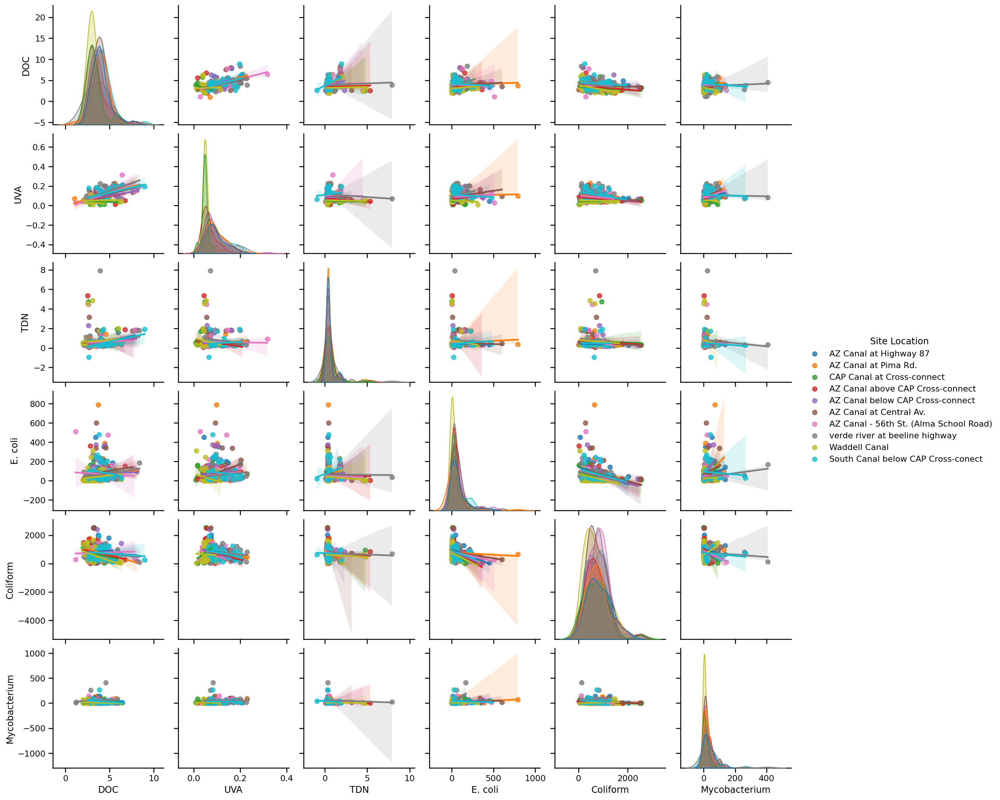

In [14]:
sns.pairplot(data,vars=['DOC', 'UVA', 'TDN', 'E. coli', 'Coliform', 'Mycobacterium'], hue= 'Site Location',kind="reg")

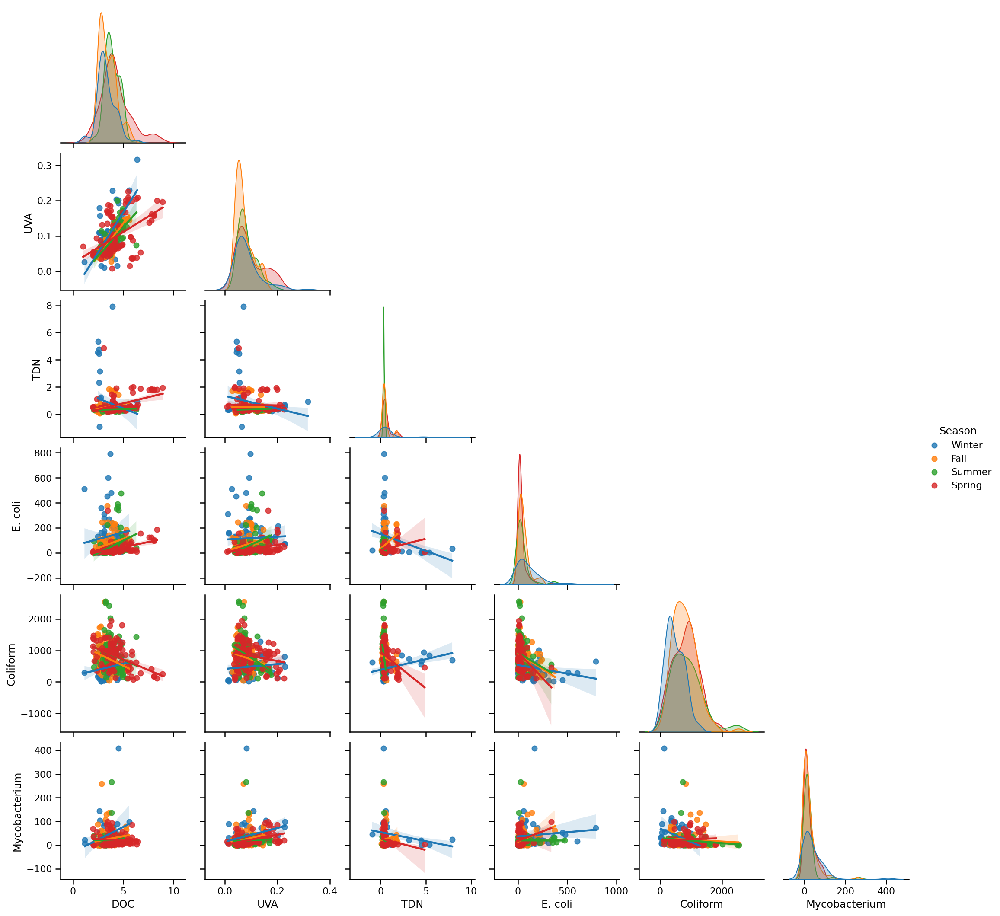

In [27]:
sns.pairplot(data,vars=['DOC', 'UVA', 'TDN', 'E. coli', 'Coliform',
       'Mycobacterium'], hue= 'Season', kind="reg",corner=True, )

/home/salorain/miniconda3/envs/qiime2-2020.11/lib/python3.6/site-packages/seaborn/distributions.py:1184: UserWarning: The following kwargs were not used by contour: 'level'
  **contour_kws,
/home/salorain/miniconda3/envs/qiime2-2020.11/lib/python3.6/site-packages/seaborn/distributions.py:1184: UserWarning: The following kwargs were not used by contour: 'level'
  **contour_kws,
/home/salorain/miniconda3/envs/qiime2-2020.11/lib/python3.6/site-packages/seaborn/distributions.py:1184: UserWarning: The following kwargs were not used by contour: 'level'
  **contour_kws,
/home/salorain/miniconda3/envs/qiime2-2020.11/lib/python3.6/site-packages/seaborn/distributions.py:1184: UserWarning: The following kwargs were not used by contour: 'level'
  **contour_kws,
/home/salorain/miniconda3/envs/qiime2-2020.11/lib/python3.6/site-packages/seaborn/distributions.py:1184: UserWarning: The following kwargs were not used by contour: 'level'
  **contour_kws,
/home/salorain/miniconda3/envs/qiime2-2020.11/lib/

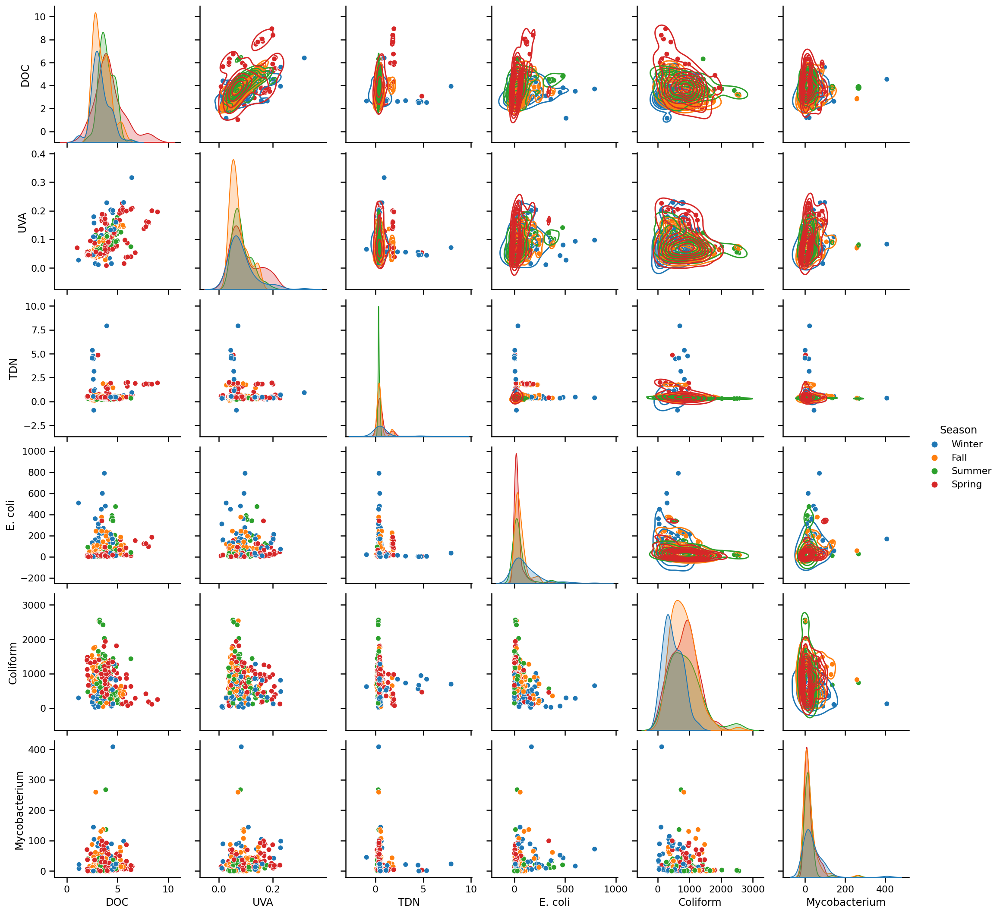

In [28]:
g = sns.pairplot(data,vars=['DOC', 'UVA', 'TDN', 'E. coli', 'Coliform',
       'Mycobacterium'],hue= 'Season', diag_kind="kde")
g.map_upper(sns.kdeplot,level= 4, color=".2")

/home/saleh/miniconda3/envs/qiime2/lib/python3.6/site-packages/seaborn/distributions.py:434: UserWarning: The following kwargs were not used by contour: 'level'
  cset = contour_func(xx, yy, z, n_levels, **kwargs)


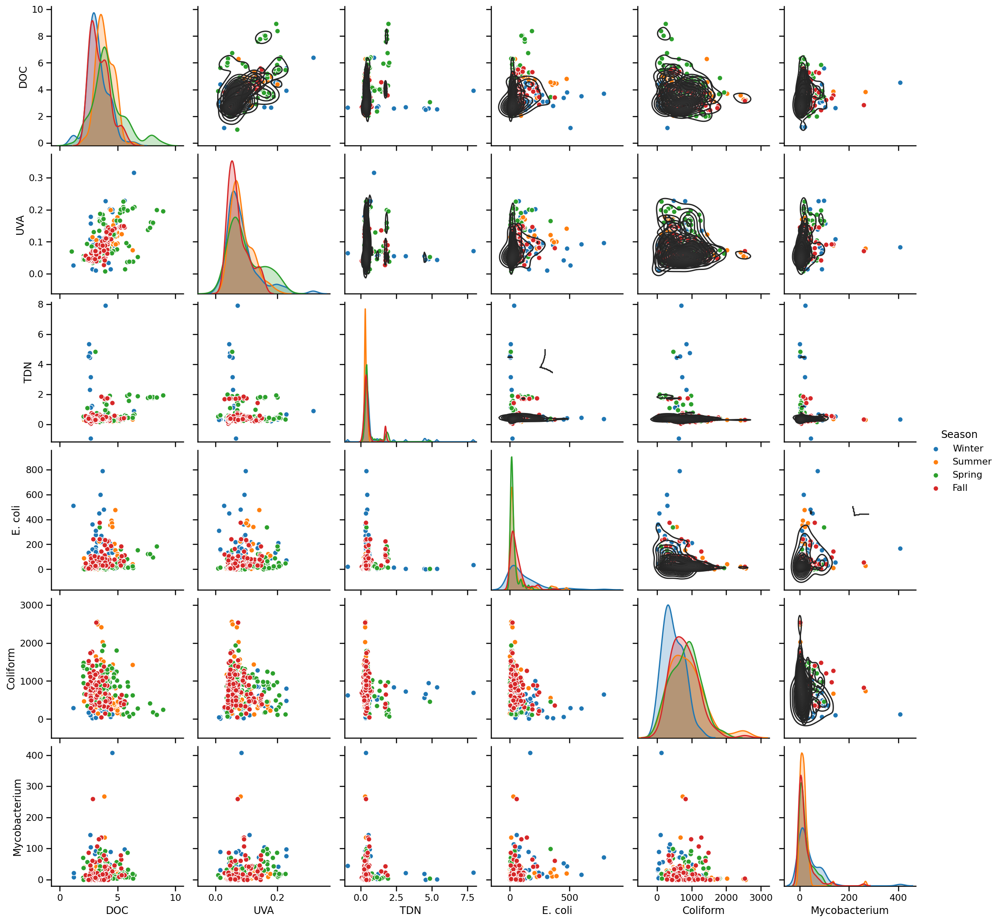

In [8]:
g = sns.pairplot(data,vars=['DOC', 'UVA', 'TDN', 'E. coli', 'Coliform',
       'Mycobacterium'],hue= 'Season',hue_order= ('Winter', 'Summer','Spring','Fall'), diag_kind="kde")
g.map_upper(sns.kdeplot,level= 4, color=".2")

/home/salorain/miniconda3/envs/qiime2-2020.11/lib/python3.6/site-packages/seaborn/distributions.py:1184: UserWarning: The following kwargs were not used by contour: 'level'
  **contour_kws,
/home/salorain/miniconda3/envs/qiime2-2020.11/lib/python3.6/site-packages/seaborn/distributions.py:1184: UserWarning: The following kwargs were not used by contour: 'level'
  **contour_kws,
/home/salorain/miniconda3/envs/qiime2-2020.11/lib/python3.6/site-packages/seaborn/distributions.py:1184: UserWarning: The following kwargs were not used by contour: 'level'
  **contour_kws,
/home/salorain/miniconda3/envs/qiime2-2020.11/lib/python3.6/site-packages/seaborn/distributions.py:1184: UserWarning: The following kwargs were not used by contour: 'level'
  **contour_kws,
/home/salorain/miniconda3/envs/qiime2-2020.11/lib/python3.6/site-packages/seaborn/distributions.py:1184: UserWarning: The following kwargs were not used by contour: 'level'
  **contour_kws,
/home/salorain/miniconda3/envs/qiime2-2020.11/lib/

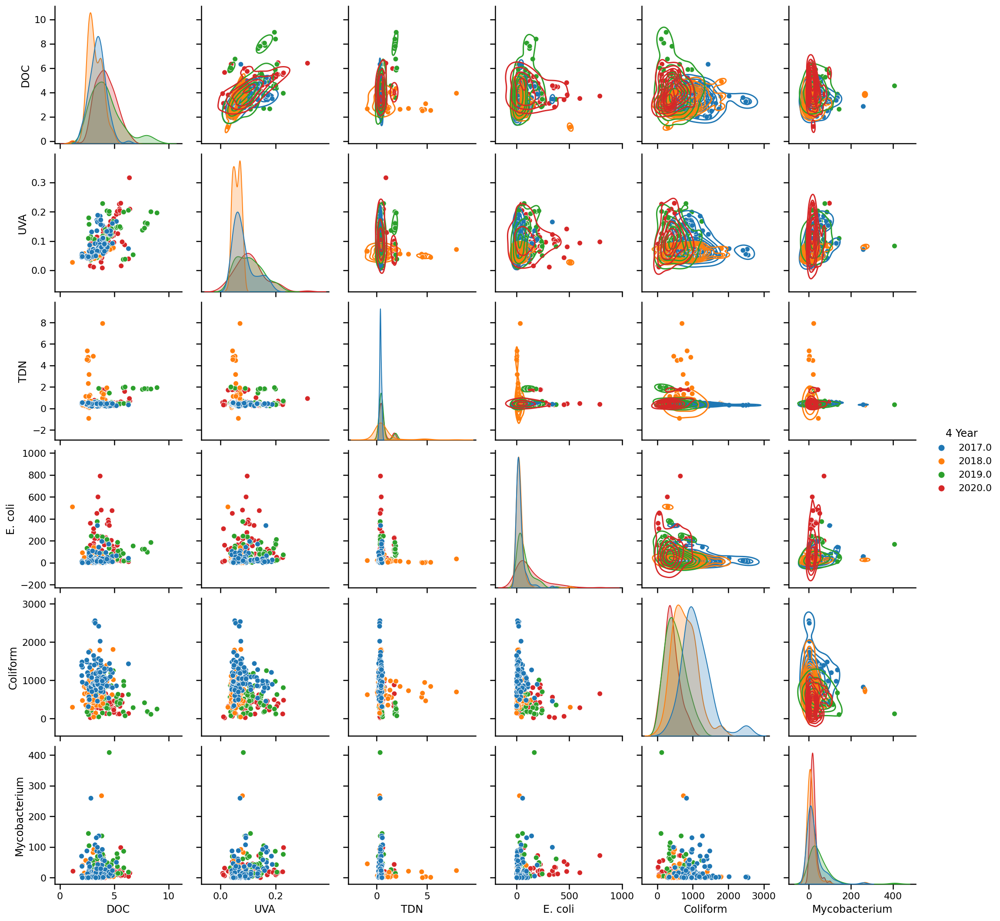

In [23]:
g = sns.pairplot(data,vars=['DOC', 'UVA', 'TDN', 'E. coli', 'Coliform',
       'Mycobacterium'],hue= '4 Year', diag_kind="kde",palette= 'tab10')
g.map_upper(sns.kdeplot,level= 4, color=".2")


/home/salorain/miniconda3/envs/qiime2-2020.11/lib/python3.6/site-packages/seaborn/distributions.py:1184: UserWarning: The following kwargs were not used by contour: 'level'
  **contour_kws,
/home/salorain/miniconda3/envs/qiime2-2020.11/lib/python3.6/site-packages/seaborn/distributions.py:1184: UserWarning: The following kwargs were not used by contour: 'level'
  **contour_kws,
/home/salorain/miniconda3/envs/qiime2-2020.11/lib/python3.6/site-packages/seaborn/distributions.py:1184: UserWarning: The following kwargs were not used by contour: 'level'
  **contour_kws,
/home/salorain/miniconda3/envs/qiime2-2020.11/lib/python3.6/site-packages/seaborn/distributions.py:1184: UserWarning: The following kwargs were not used by contour: 'level'
  **contour_kws,
/home/salorain/miniconda3/envs/qiime2-2020.11/lib/python3.6/site-packages/seaborn/distributions.py:1184: UserWarning: The following kwargs were not used by contour: 'level'
  **contour_kws,
/home/salorain/miniconda3/envs/qiime2-2020.11/lib/

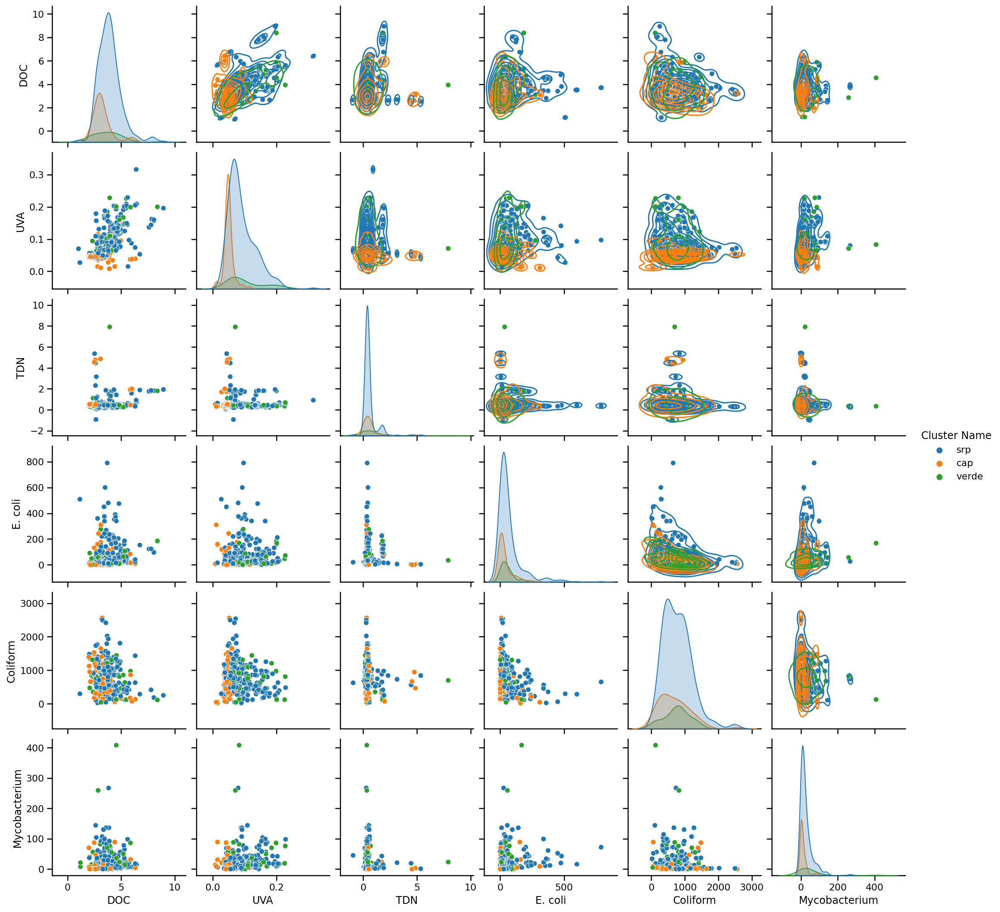

In [13]:
g = sns.pairplot(data,vars=['DOC', 'UVA', 'TDN', 'E. coli', 'Coliform',
       'Mycobacterium'],hue= 'Cluster Name', diag_kind="kde")
g.map_upper(sns.kdeplot,level= 4, color=".2")

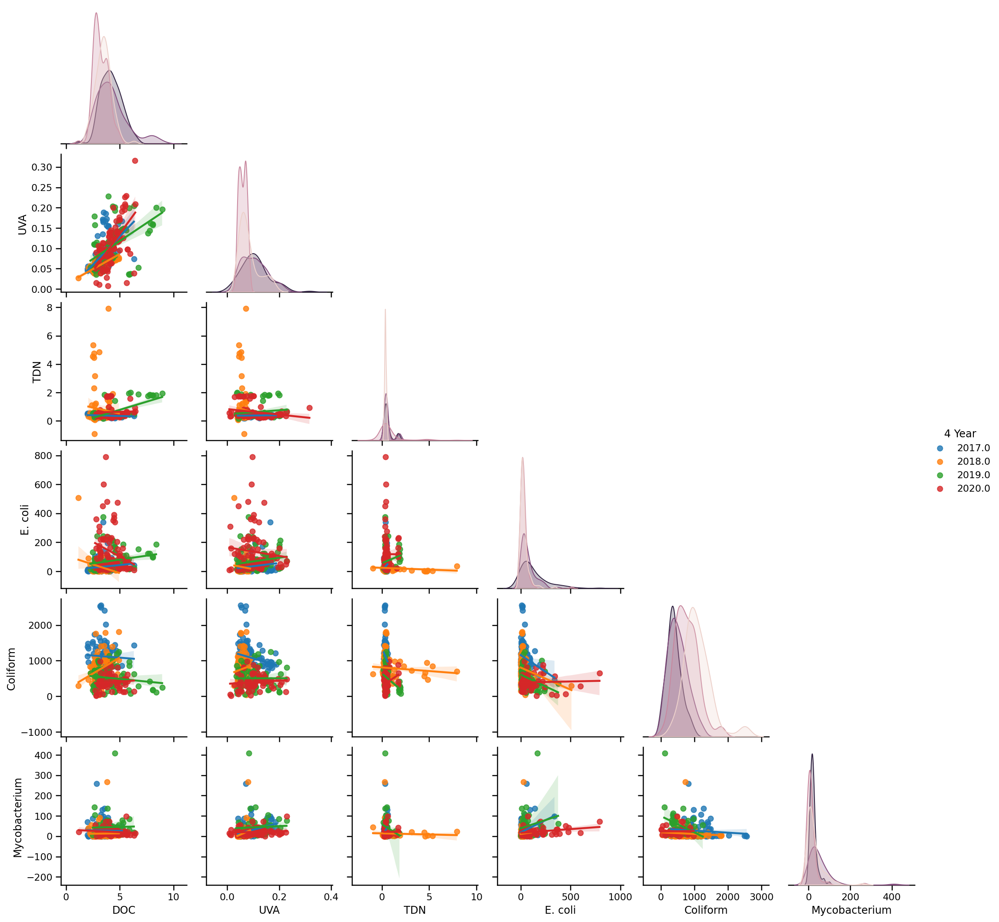

In [24]:
sns.pairplot(data,vars=['DOC', 'UVA', 'TDN', 'E. coli', 'Coliform',
       'Mycobacterium'], hue= '4 Year', kind="reg",corner=True, )

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D


from sklearn import decomposition
from sklearn import datasets

In [2]:

np.random.seed(5)

In [23]:
iris = 'rwq2021.csv'


In [26]:
iris.head()

AttributeError: 'str' object has no attribute 'head'

In [21]:
iris.columns


AttributeError: 'str' object has no attribute 'columns'